<h1>Intro to Computer Music, Lab4</h1>
<h2>Gus Xia, NYU Shanghai</h2>

<h3>Recall our ideas on music synthesis:</h3>

<h4>1. Additive synthesis (simple)</h4>
       1.1 We can redefine overtones! (Ambitious!)
<h4>2. Sampling synthesis (straightforward)</h4> 
       2.1 change the play order.    2.2 Intentional aliasing! (today's Lab)
<h4>3. AM - Change the amplitude in real time.</h4>
<h4>4. FM - Change the frequency in real time.</h4>
       4.1 Micro tuning (worth a try!)
<h4>5. Waveform generation</h4>
       5.1 Basic: square, saw, impulse train.
       5.2 Complex: compound, fractal? (use imagination)</h4>
<h4>6. Filtering (today's Lab)</h4>

Again, here is a jupyter notebook cheat sheet:
https://www.cheatography.com/weidadeyue/cheat-sheets/jupyter-notebook/

<h2> Load packages </h2>



In [259]:
# To begin using librosa we need to import it, and other tools such as matplotlib and numpy
from operator import add
from pylab import *
import librosa             # The librosa library
import librosa.display     # librosa's display module (for plotting features)
import IPython.display     # IPython's display module (for in-line audio)
import matplotlib.pyplot as plt # matplotlib plotting functions
import matplotlib.style as ms   # plotting style
import numpy as np              # numpy numerical functions
ms.use('seaborn-muted')         # fancy plot designs
from __future__ import print_function # use the print() function from Python3

<h2>Recap: A pure sine wave </h2>


In [260]:
# create a sine wave from scratch 
# try to modify some parameters
A = 1;
f = 440;
#f = 440 * 11
phi = 0;
sr = 44100;
#sr = 4410
T = 5;
y = [A * sin(2*pi*f*t + phi) for t in arange(0.,T,1./sr)]
# write it as a function

IPython.display.Audio(data=y, rate=sr) # press the "play" button to hear audio

<h2>2.2 Intentional aliasing, a simple example</h2>

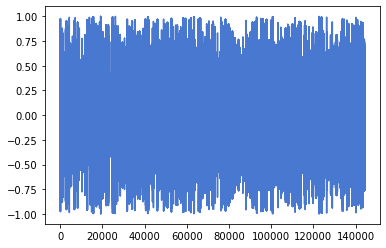

In [261]:
def cos_wave(A, f, t, sr):
    return [A * cos(2*pi*f*t) for t in arange(0.,t,1./sr)]

f0 = 300;
ratio = 2
ratio = 2**(1./7)
yy = []
for i in range(0,1000):
    y = cos_wave(random(), f0 * (ratio**i), random(), 300.)
    #print(i, f0 * (ratio**i), )
    yy = yy + y
plt.plot(yy)
IPython.display.Audio(data=yy, rate=4410) 

<h3> Question 1: Create some interesting sound using aliasing. </h3>

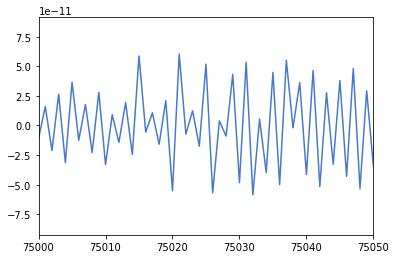

In [265]:
def sin_wave(A, f, t, sr):
    return [A * sin(2*pi*f*t) for t in arange(0.,t,1./sr)]
A = 1;
f1 = 432;
sr1 = 864;
t = 100;

triangle = sin_wave(A, f1,t,sr1);
plt.plot(triangle)
plt.xlim(75000,75050)
IPython.display.Audio(data=triangle, rate=4410)

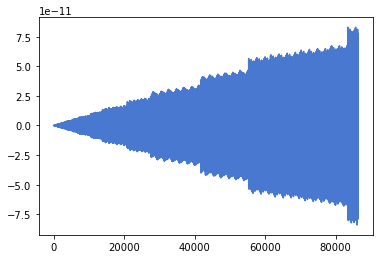

In [266]:
plt.plot(triangle)

<h3> Question 2 (Bonus): For the example sound, why we hear more "noise" toward the end? </h3>

After 10 seconds when the frequency is more and more large, the changes in amplitude sometimes become too small for the computer to record when quantifying the signals. 

<h2>5.2 Waveform creation via bit-wise function, a very interesting case</h2>

In [268]:
#wave = [x & x >> 8  for x in range(1000, 2000)]
#print(wave)

In [269]:
#'00101' -> '00010'
#x = 5 
#x >> 1

In [300]:
wave = [min(x & x >> 8, 1) for x in range(100000)]
IPython.display.Audio(data = wave, rate=4410)

<h3>Question 3: Plot the wave to see the "shape" of this strange signal, describe your observation. 

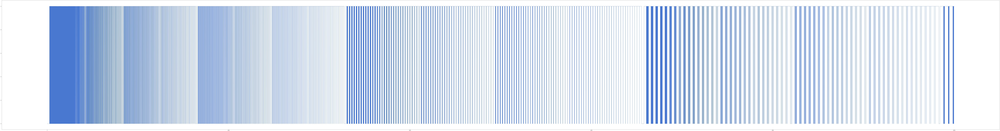

In [301]:
wave = [min(x & x >> 8, 1) for x in range(100000)]
plt.plot(wave)
plt.show()
plt.rcParams['figure.figsize'] = (300.0, 40.0) 

The shape of the signal gradually changes from triangle wave into square wave and the interval, or in other words, the wavelength of the square waves is larger and larger. And I think that's why it appears like triangle wave in the beginning because the wavelength at that time tends to be zero. Whrn the wavelegth becomes larger, the voice sounds lower. 

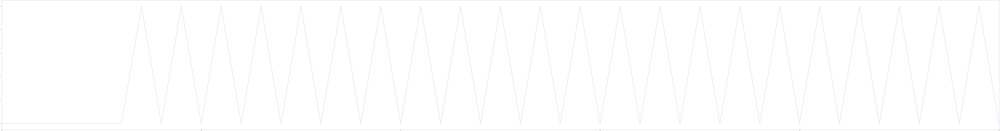

In [297]:
plt.plot(wave)
plt.xlim(250, 300)
plt.show()
plt.rcParams['figure.figsize'] = (10,8) 

(99800.0, 100000.0)

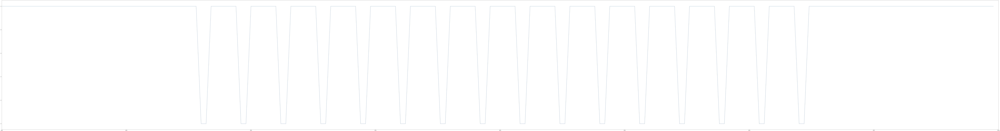

In [293]:
plt.plot(wave)
plt.xlim(99800,100000)
plt.rcParams['figure.figsize'] = (10,8) 

<h3>Question 4: Create some interesting sound using bit-wise function.</h3>

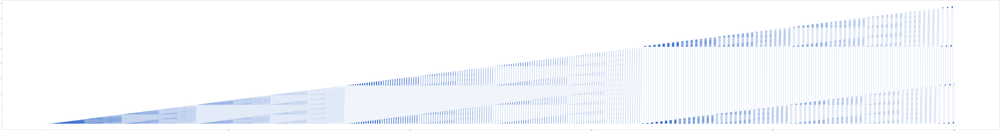

In [294]:
# your answer
wave = [max(x & x >> 8, 1) + min(x & x >> 16, 1) for x in range(100000)] #LOWER your VOLUME
plt.plot(wave)
plt.show()
plt.rcParams['figure.figsize'] = (10,8) 
IPython.display.Audio(data = wave, rate=4410)


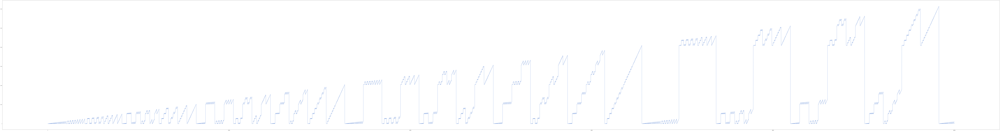

In [302]:
wave = [max(x & x >> 4, 1)+ min(x & x >> 8, 1) for x in range(100000)]
plt.plot(wave)
plt.show()
plt.rcParams['figure.figsize'] = (10,8) 
IPython.display.Audio(data = wave, rate=4410)

<h2>6 Filtering</h2>

<h4>compute the spectrogram</h4>

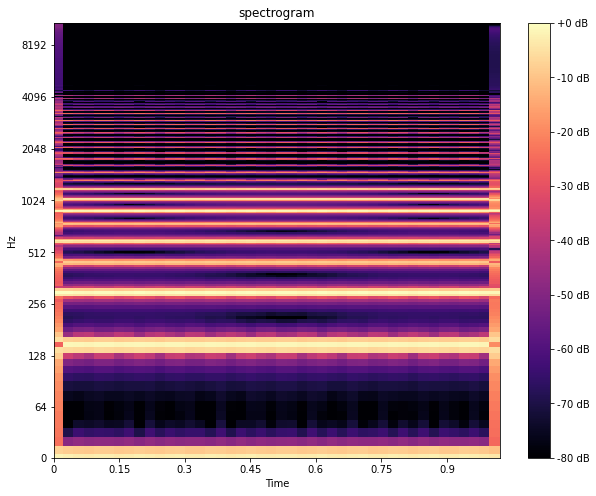

In [303]:
# a lazy copy from librosa doc
y, sr = librosa.load('./fakevoice.wav')
D = librosa.stft(y, n_fft=2048,hop_length=1024,win_length=2048,window='hann') #stft short time fourie transform 
librosa.display.specshow(librosa.amplitude_to_db(np.abs(D), ref=np.max), y_axis='log', x_axis='time')
plt.title('spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()
IPython.display.Audio(data=y, rate=sr) # press the "play" button to hear audio

<h4>inspect the spectrogram variable</h4>

In [304]:
# decompose it into mag and phase, and then combine them
magnitude, phase = librosa.magphase(D)
D_hat = magnitude * phase
#D_hat = np.multiply(magnitude,phase)
print(D)
print(type(D),type(magnitude),type(phase))
print("mag size: ",magnitude.size, ", phase size", phase.size, ", D size", D.size)
print("mag ndim: ",magnitude.ndim, ", phase ndim", phase.ndim, ", D ndim", D.ndim)
print("shape: ",magnitude.shape, ", phase shape", phase.shape, ", D shape", D.shape)
y_hat = librosa.istft(D_hat,hop_length=1024,win_length=2048,window='hann')
IPython.display.Audio(data=y_hat, rate=sr) # press the "play" button to hear audio

[[ 1.7789992e+02+0.00000000e+00j  1.6568144e+02+0.00000000e+00j
   1.5606573e+02+0.00000000e+00j ...  1.6190079e+02+0.00000000e+00j
   1.5172008e+02+0.00000000e+00j  1.4163766e+02+0.00000000e+00j]
 [-9.5377586e+01-7.07767178e-16j -8.3741913e+01-5.85491002e-01j
  -7.7722939e+01-3.05309033e+00j ... -8.1373024e+01-2.89640713e+00j
  -7.4997658e+01-9.50059116e-01j -6.5655167e+01-2.18050504e+00j]
 [ 1.4071274e+01-1.60029914e-15j  7.7054441e-01+1.72081470e-01j
  -2.8523508e-01+9.17518735e-01j ...  3.5684153e-01+8.77806246e-01j
  -7.5873739e-01+2.90513366e-01j -1.0634883e+01+4.89039469e+00j]
 ...
 [ 6.6109037e-01-7.86680315e-16j -3.2021437e-06+1.14004585e-07j
  -2.9515784e-06+1.18930609e-06j ...  3.3818330e-06+4.57474198e-06j
  -3.0901447e-06+1.07951644e-06j -4.1077137e-03-1.76794187e-03j]
 [-6.6098934e-01-7.91033905e-16j -1.9431756e-05+7.36358857e-07j
   6.1642918e-06-8.54811958e-07j ... -1.3543586e-06-9.17142643e-06j
  -1.3816073e-06+1.08842960e-06j  4.5268643e-03+9.33588599e-04j]
 [ 6.60959

<h4>Without any filtering, just convert it back using i-stft</h4>

In [305]:
y_hat2 = librosa.istft(D, hop_length=1024, win_length=2048, window='hann')
IPython.display.Audio(data=y_hat2, rate=sr) # press the "play" button to hear audio

<h4>Now apply a naive filter, then convert it back using i-stft</h4>

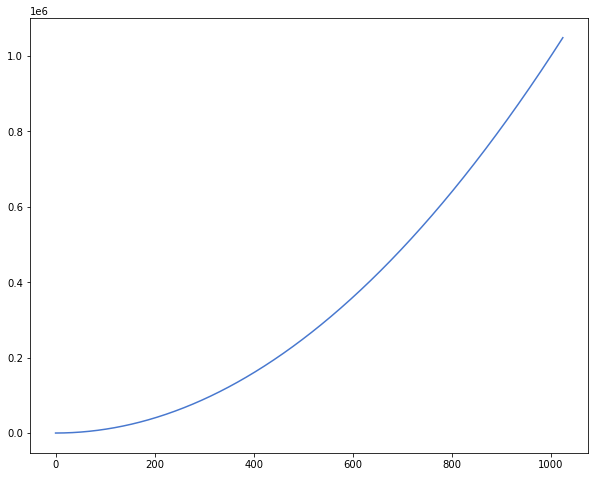

In [306]:
y = np.array([n**2 for n in arange(1025)])
plt.plot(y)

/Users/yutianqin/opt/anaconda3/lib/python3.8/site-packages/librosa/core/spectrum.py:1641: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn(


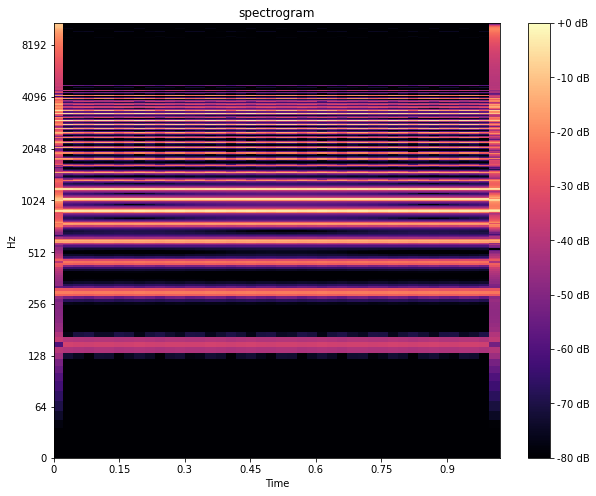

In [307]:
magnitude = (magnitude.transpose() * np.array([n**2 for n in arange(1025)])).transpose()
D_hat = np.multiply(magnitude,phase)
librosa.display.specshow(librosa.amplitude_to_db(D_hat, ref=np.max), y_axis='log', x_axis='time')
plt.title('spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()
y_hat3 = librosa.istft(D_hat, hop_length=1024, win_length=2048, window='hann')
IPython.display.Audio(data=y_hat3, rate=sr) # press the "play" button to hear audio

<h3>Question 5: Try to create a RESON filter and apply to your own wave file.</h3>




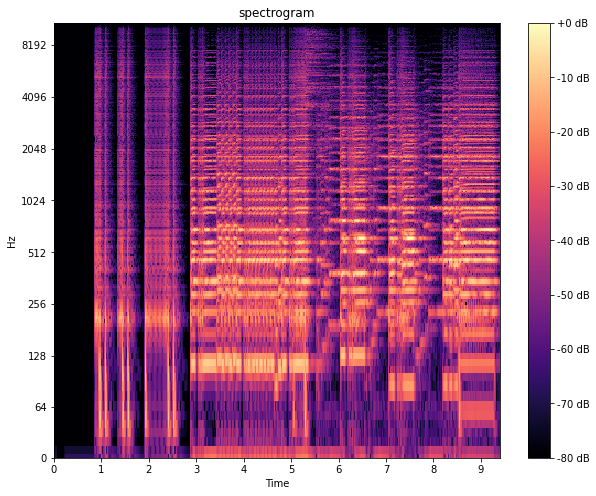

In [308]:
ff, sr = librosa.load('Fox.wav')
C = librosa.stft(ff, n_fft=2048,hop_length=1024,win_length=2048,window='hann') 
librosa.display.specshow(librosa.amplitude_to_db(np.abs(C), ref=np.max), y_axis='log', x_axis='time')
plt.title('spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()
IPython.display.Audio(data=ff, rate=sr)

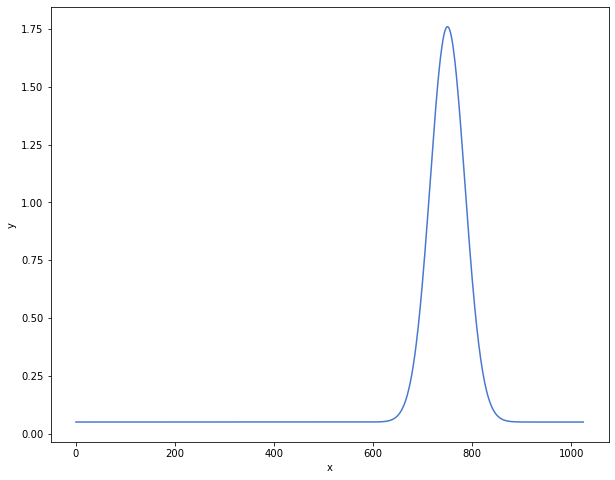

[0.05 0.05 0.05 ... 0.05 0.05 0.05]


In [309]:
from scipy.stats import norm
dmean=750
dstd=35
x=np.arange(0,1025,1)
y=norm.pdf(x,dmean,dstd)*150 + 0.05
RESON = np.array([(norm.pdf(x,dmean,dstd)*10000 + 10) for x in arange(1025)])
plt.plot(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.show()
print(y)

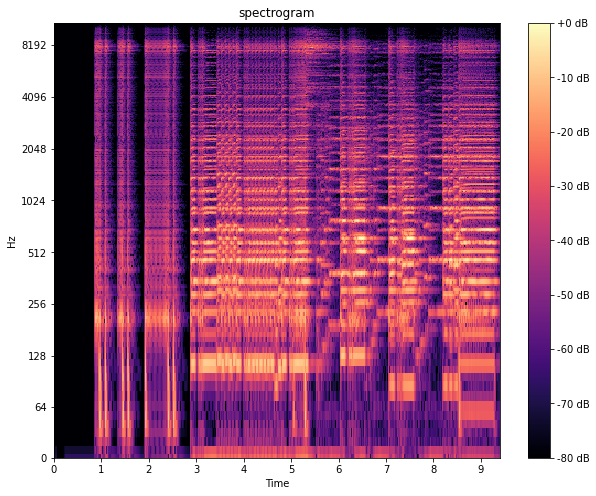

In [312]:
magnitude1, phase1 = librosa.magphase(C)
C_hat = magnitude1 * phase1

magnitude1 = (magnitude1.transpose() * RESON).transpose()
C_hat = np.multiply(magnitude1,phase1)
librosa.display.specshow(librosa.amplitude_to_db(C_hat, ref=np.max), y_axis='log', x_axis='time')
plt.title('spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()
y_hat4 = librosa.istft(C_hat, hop_length=1024, win_length=2048, window='hann')
IPython.display.Audio(data=y_hat4, rate=sr)

<h3>Question 6 (Bonus): If we make the hop size == window size, what will happen to the reconstructed sound? Please briefly describe and explain why.</h3>

In [311]:
y_hat5 = librosa.istft(C, hop_length=2048, win_length=2048, window='hann')
IPython.display.Audio(data=y_hat5, rate=sr)

There will be small gaps between windows which makes the output incontinuous and lengthen the wave file. 

<h3>Question 7 (Bonus): Try to combine the mag and phase from two different sounds, and briefly describe what happened.</h3>

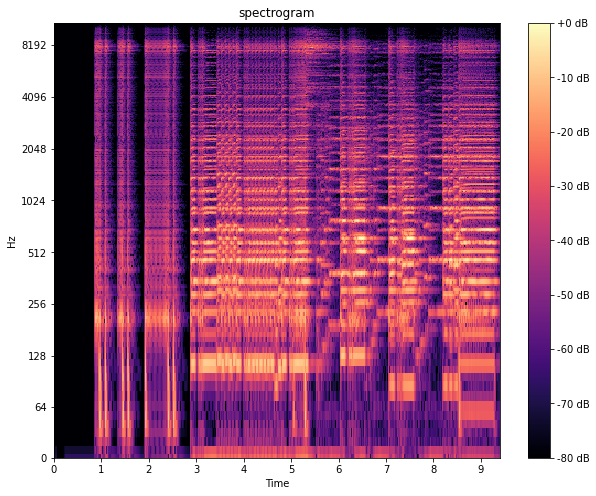

In [313]:
E_hat = np.multiply(magnitude1,phase)
librosa.display.specshow(librosa.amplitude_to_db(E_hat, ref=np.max), y_axis='log', x_axis='time')
plt.title('spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()
y_hat5 = librosa.istft(E_hat, hop_length=1024, win_length=2048, window='hann')
IPython.display.Audio(data=y_hat5, rate=sr)

In question7 the magnitude of the 20th Century Fox multiplied the phase of the fake voice. I think it shows that human ears are not sensitive to phase becuase I cannot tell the difference between y_hat5 and y_hat4. They sounds the same despite the fact that they have different phase. 